In [1]:
import cv2

In [2]:
import PIL

C:\Users\Admin\Anaconda2\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


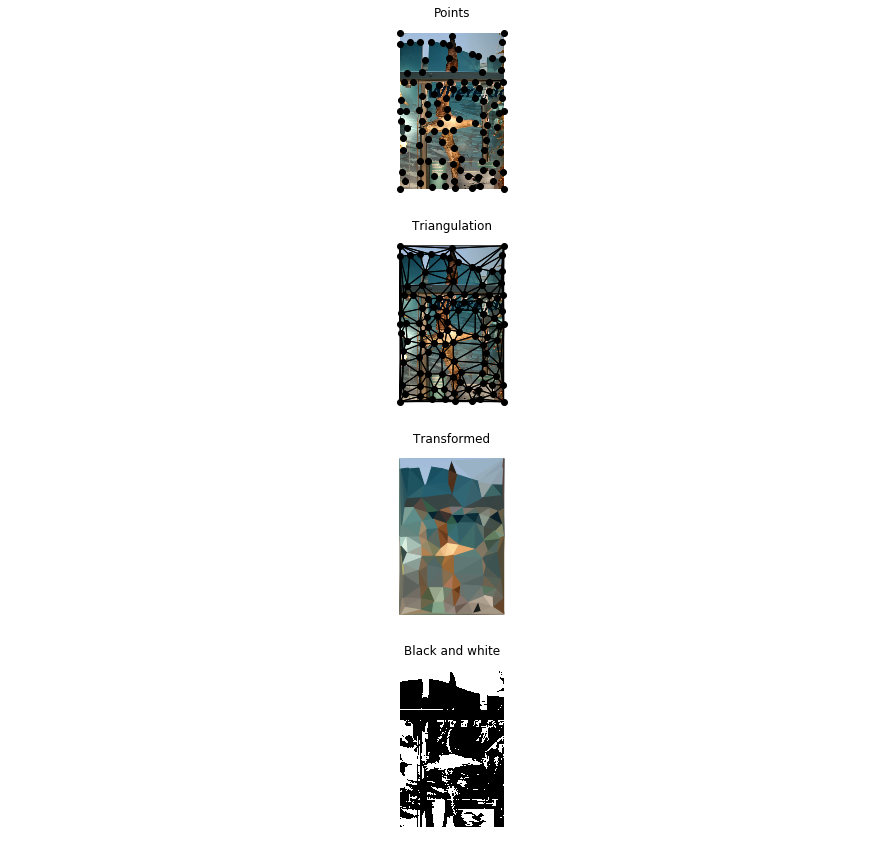

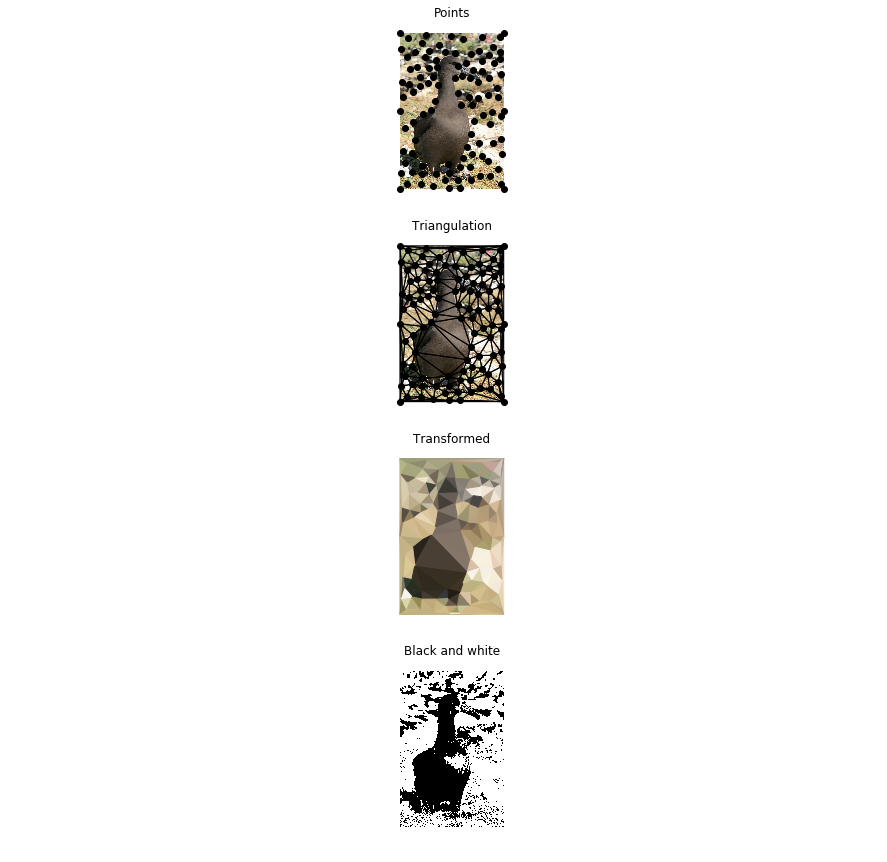

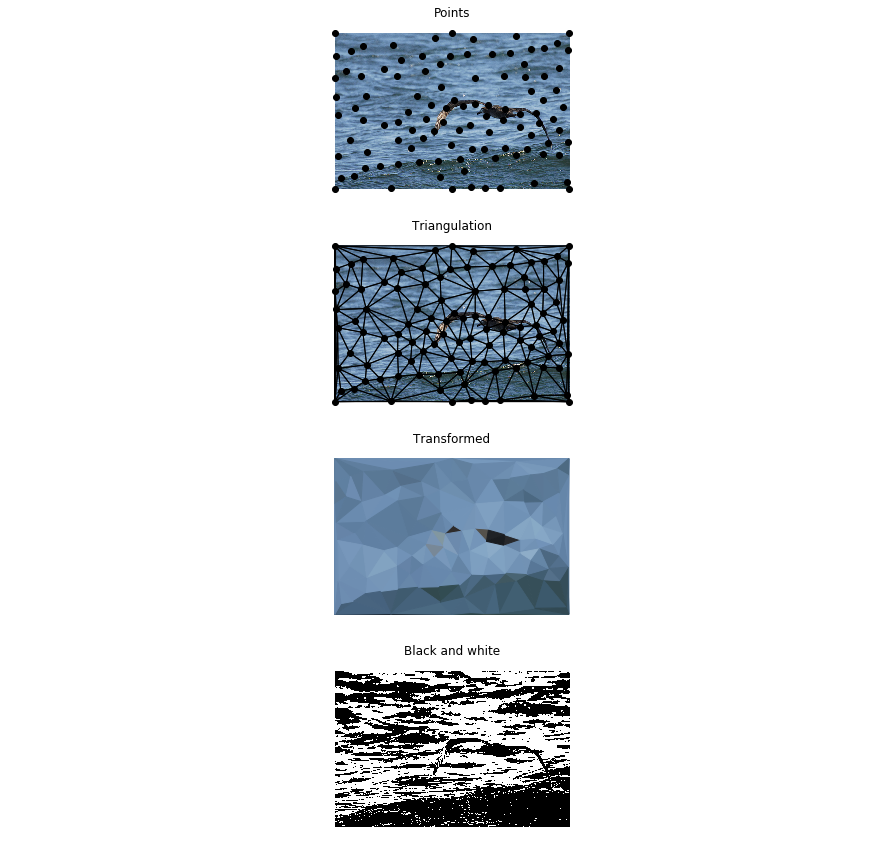

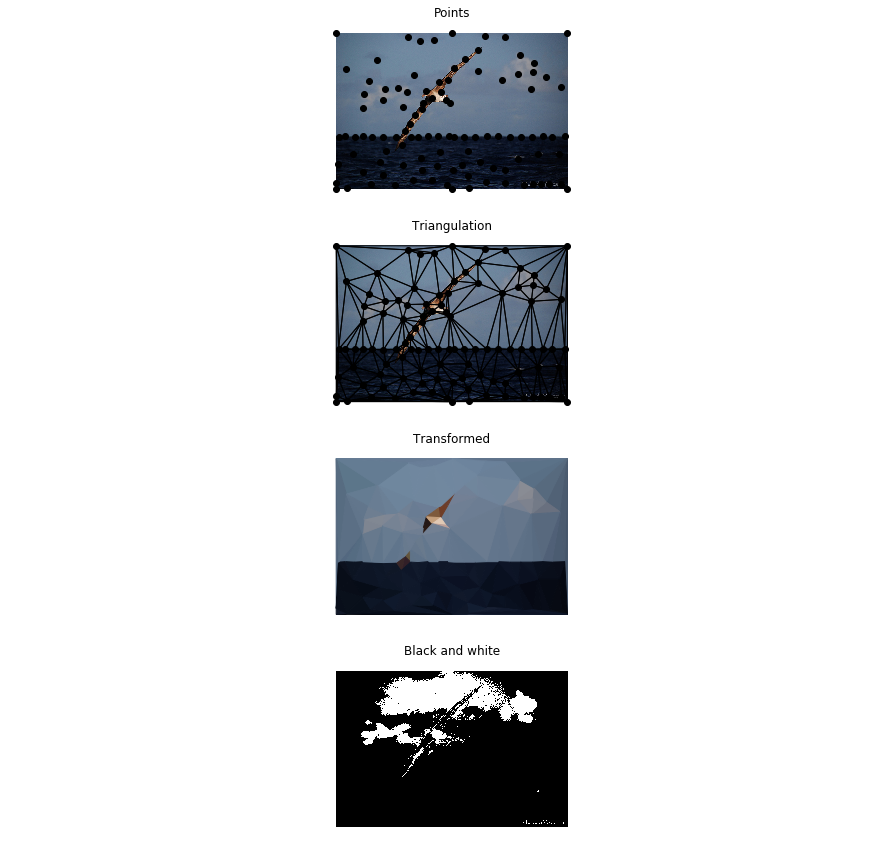

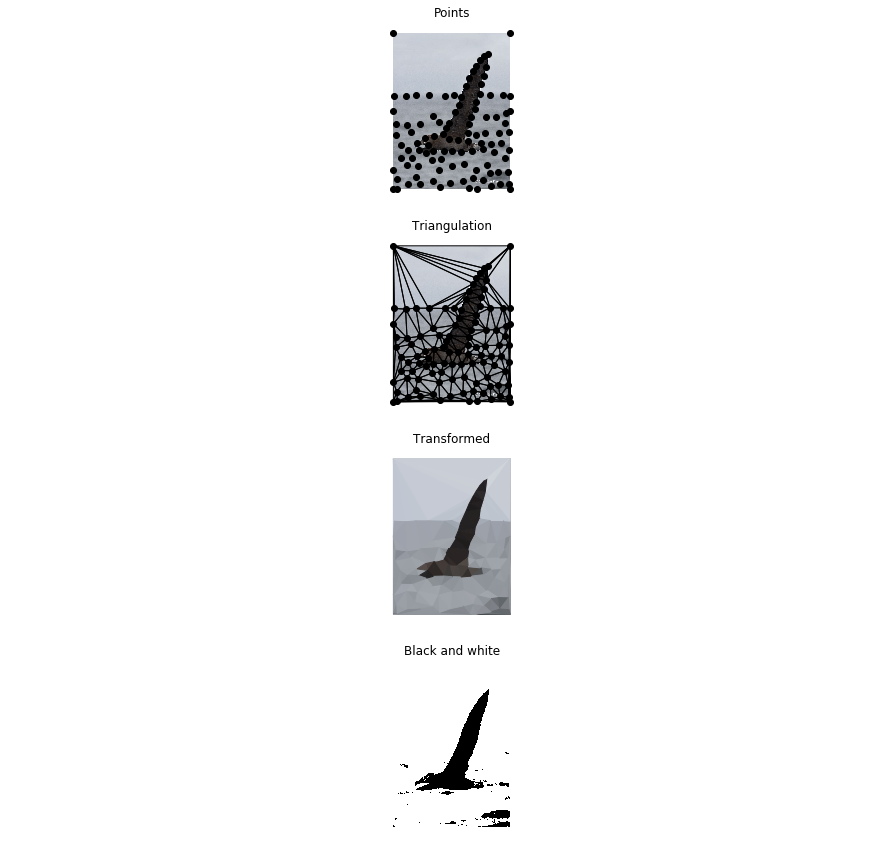

...

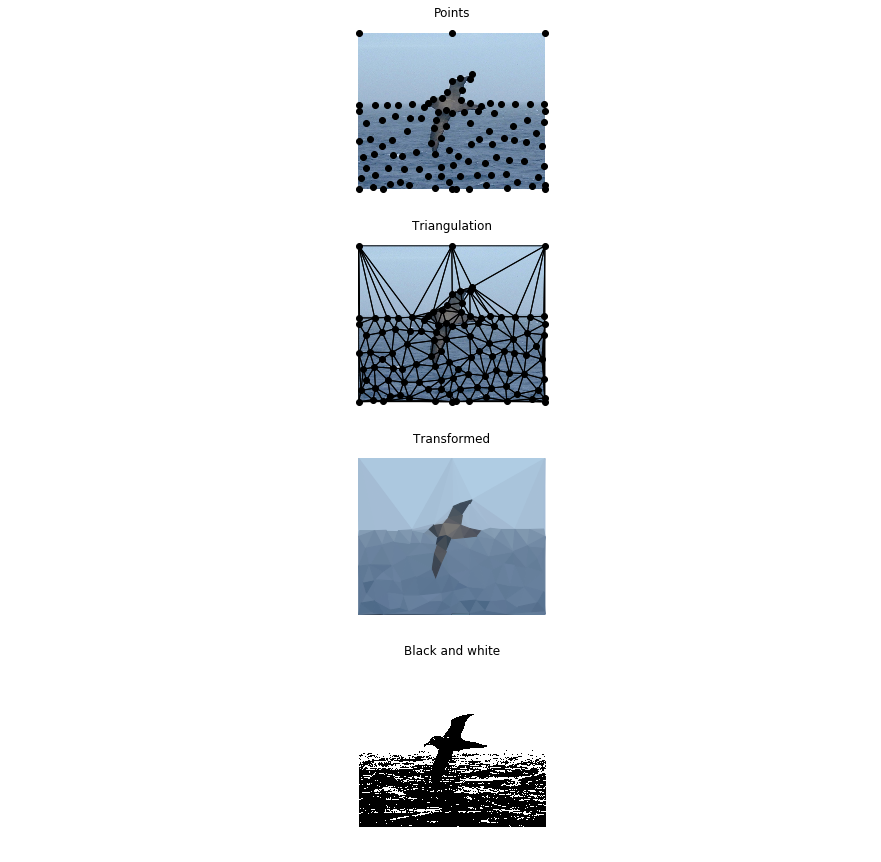

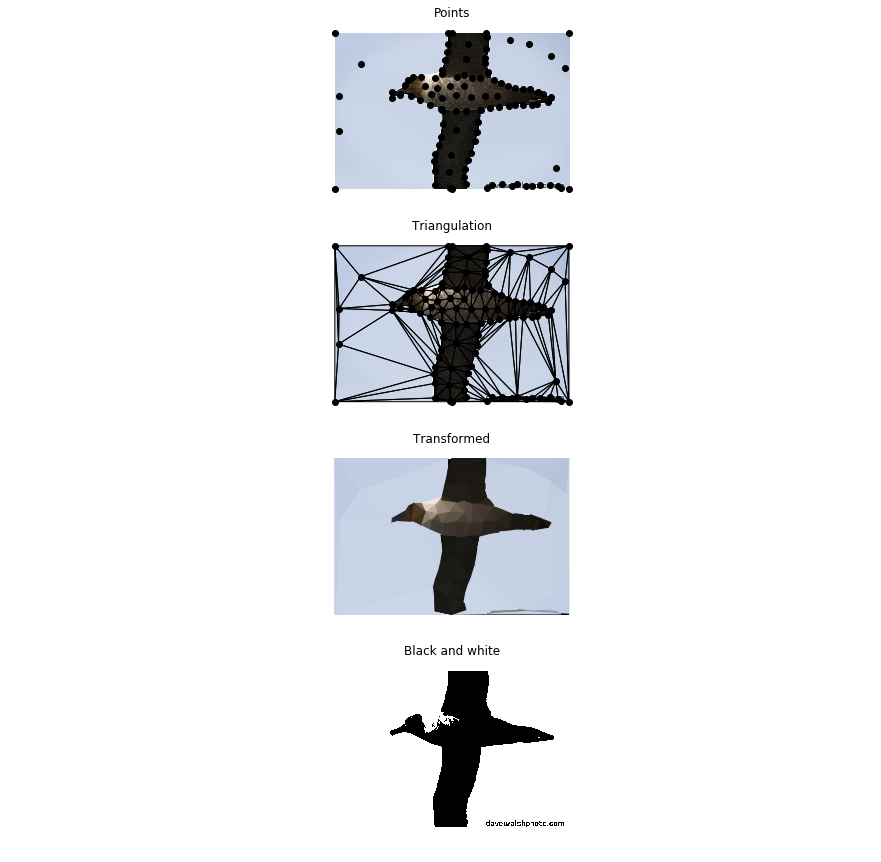

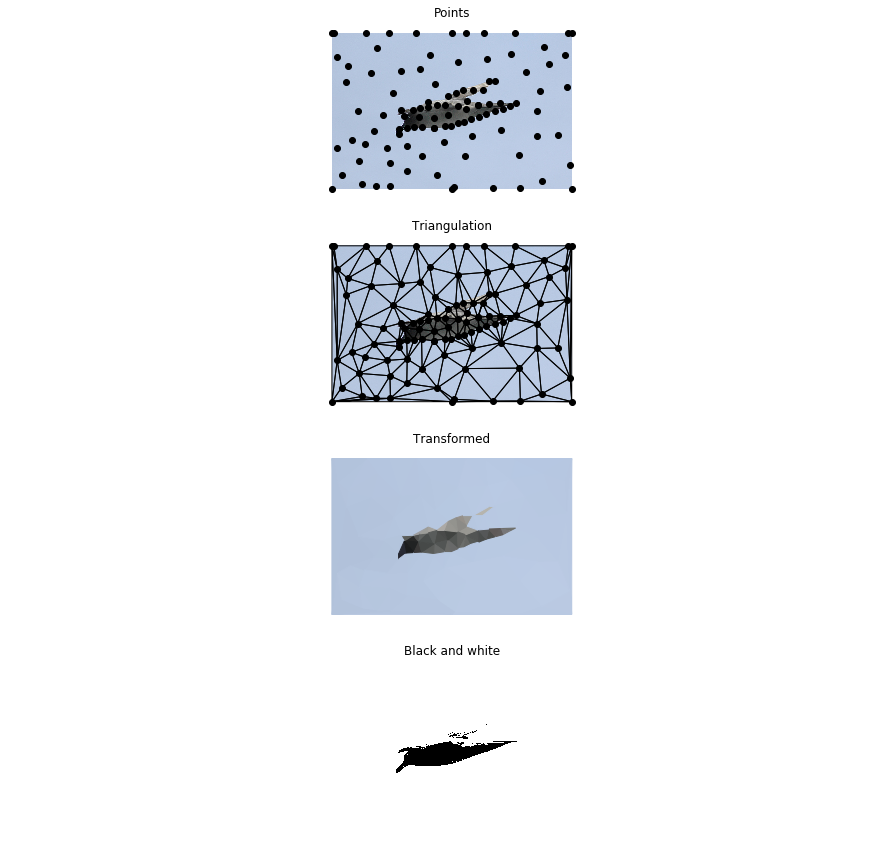

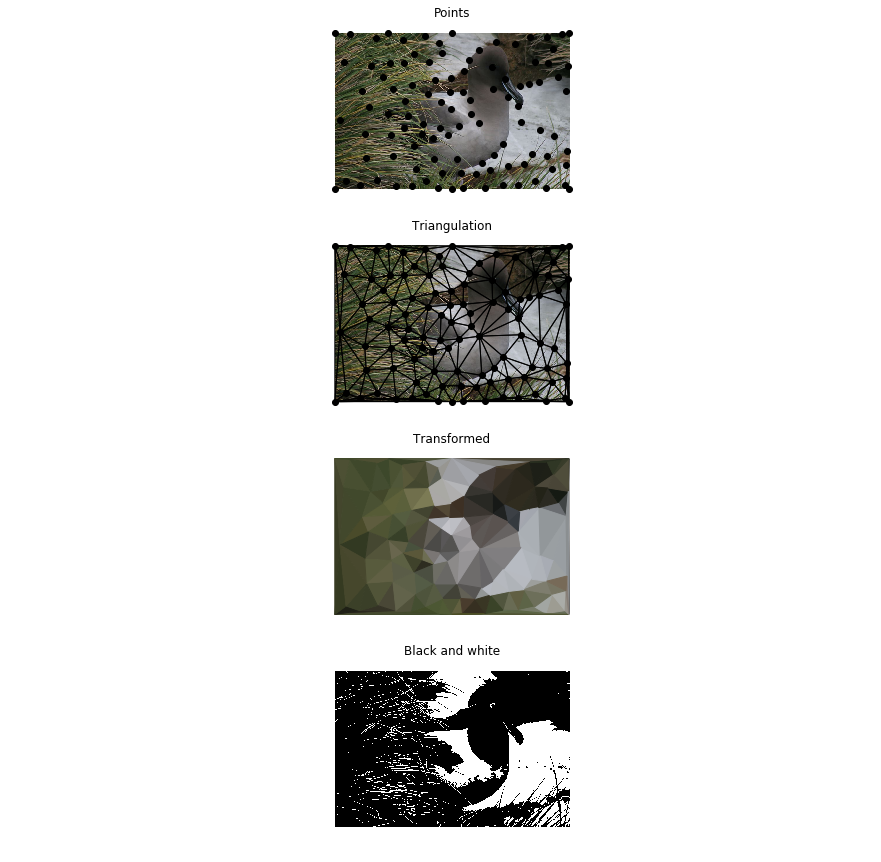

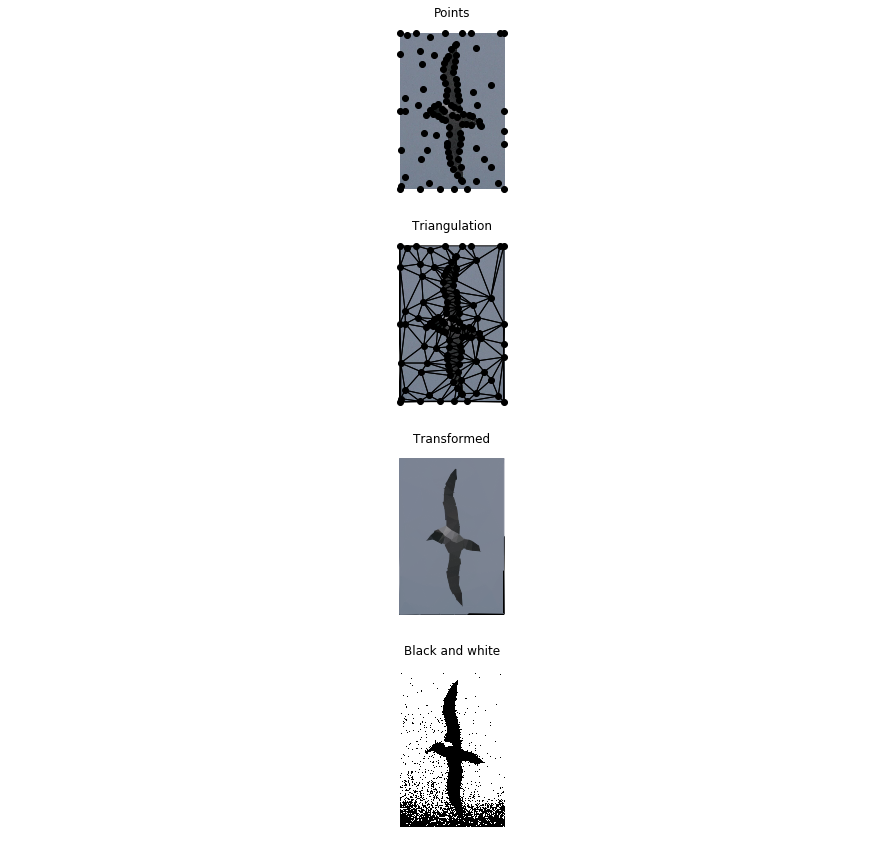

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

In [3]:
import numpy as np
import matplotlib.pylab as plt
from PIL import Image
import matplotlib.image as mpimg
import matplotlib.pyplot as pylt
from scipy.spatial import Delaunay

%matplotlib inline
    
import glob
from triangulared import *



photo_files = glob.glob("C:/Users/Admin/Desktop/image-master/jpg/*")

t = photo_files[1]

current_im = plt.imread(t)

for ci in photo_files:

    current_im = plt.imread(ci)

    current_points = generate_max_entropy_points(current_im)
    current_points = np.concatenate([current_points, edge_points(current_im)])
    tri = Delaunay(current_points)

    fig, axs = plt.subplots(nrows=4, figsize=(15,15), sharey=True)

    ax = axs[0]
    draw_image(ax, current_im)
    draw_points(ax, current_points)
    ax.set_title("Points")
    set_axis_defaults(ax)


    ax = axs[1]
    draw_image(ax, current_im)
    draw_points(ax, current_points)
    draw_triangles(ax, tri.points, tri.vertices)
    ax.set_title("Triangulation")
    set_axis_defaults(ax)


    ax = axs[2]
    triangle_colours = get_triangle_colour(tri, current_im, agg_func=np.median)
    draw_triangles(ax, tri.points, tri.vertices, triangle_colours)
    ax.set_title("Transformed")
    set_axis_defaults(ax)
    
    
    ax= axs[3]
    #current_im
    col = Image.fromarray(current_im)
    gray = col.convert('L')
    bw=gray.point(lambda x: 0 if x<128 else 255, '1')
    pylt.imshow(bw)
    ax.set_title("Black and white")
    set_axis_defaults(ax)

In [5]:
print str(len(photo_files))

99


# energy and entropy

In [7]:
from scipy.spatial import Voronoi
import cv2
import numpy as np
import matplotlib.pylab as plb
import matplotlib.pyplot as plt
import glob
from skimage.feature import local_binary_pattern, greycomatrix, greycoprops
from skimage.filters import gabor
import PIL
import os

In [9]:
import os
from skimage.feature import local_binary_pattern, greycomatrix, greycoprops
from skimage.filters import gabor
photo_files = glob.glob("C:/Users/Admin/Desktop/image-master/jpg/*")
l=[]
for ci in photo_files:
    
    b={}
    b['IMG_Name']=(os.path.split(ci)[-1])
    current_im = cv2.imread(ci)
    gray_image = cv2.cvtColor(current_im, cv2.COLOR_BGR2GRAY)
    img_arr = np.array(gray_image)
    feat_lbp = local_binary_pattern(img_arr,8,1,'uniform') #Radius = 1, No. of neighbours = 8
    feat_lbp = np.uint8((feat_lbp/feat_lbp.max())*255) #Converting to unit8
    lbp_hist,_ = np.histogram(feat_lbp,8)
    lbp_hist = np.array(lbp_hist,dtype=float)
    lbp_prob = np.divide(lbp_hist,np.sum(lbp_hist))
    lbp_energy = np.sum(lbp_prob**2)
    lbp_entropy = -np.sum(np.multiply(lbp_prob,np.log2(lbp_prob)))
    b['LBP energy'] = str(lbp_energy)
    b['LBP entropy'] = str(lbp_entropy)
    
    
    # Gabor filter
    gaborFilt_real,gaborFilt_imag = gabor(img_arr,frequency=0.6)
    gaborFilt = (gaborFilt_real**2+gaborFilt_imag**2)//2
    gabor_hist,_ = np.histogram(gaborFilt,8)
    gabor_hist = np.array(gabor_hist,dtype=float)
    gabor_prob = np.divide(gabor_hist,np.sum(gabor_hist))
    gabor_energy = np.sum(gabor_prob**2)
    gabor_entropy = -np.sum(np.multiply(gabor_prob,np.log2(gabor_prob)))
    b['Gabor energy']= str(gabor_energy)
    b['Gabor entropy']= str(gabor_entropy)
    l.append(b)
    

In [10]:
import pandas as pd
df=pd.DataFrame(l)
df.set_index('IMG_Name', inplace=True)
print (df)

                   Gabor energy   Gabor entropy      LBP energy  \
IMG_Name                                                          
image_00001.jpg  0.249704424569   2.32141671986  0.160446349052   
image_00002.jpg  0.175917237887   2.75553976512  0.146518836675   
image_00003.jpg  0.262441608383   2.07199053572  0.151375307848   
image_00004.jpg   0.34189318874   1.64802725017  0.179378215393   
image_00005.jpg  0.198864662357   2.48674105998  0.227526095644   
image_00006.jpg  0.458439058761   1.57028958056  0.156811512307   
image_00007.jpg  0.281126379285   2.08489482517  0.171583709093   
image_00008.jpg  0.227070993876    2.3479262417  0.163185268484   
image_00009.jpg  0.284164807917   1.95811281007  0.176424316541   
image_0001.jpg   0.368514109079   1.84372485514  0.157970656617   
image_00010.jpg  0.193557857459   2.58857926216  0.159941969368   
image_00011.jpg  0.270440071107   2.20465883559  0.164963562176   
image_00012.jpg  0.455603985693   1.52939298337  0.23929386893

In [11]:
df.to_csv('image feature extraction.csv')
df=pd.read_csv("image feature extraction.csv")

In [12]:
df

,IMG_Name,Gabor energy,Gabor entropy,LBP energy,LBP entropy
0,image_00001.jpg,0.249704,2.321417,0.160446,2.802843
1,image_00002.jpg,0.175917,2.755540,0.146519,2.876231
2,image_00003.jpg,0.262442,2.071991,0.151375,2.844386
3,image_00004.jpg,0.341893,1.648027,0.179378,2.740148
4,image_00005.jpg,0.198865,2.486741,0.227526,2.538963
5,image_00006.jpg,0.458439,1.570290,0.156812,2.813080
6,image_00007.jpg,0.281126,2.084895,0.171584,2.733255
7,image_00008.jpg,0.227071,2.347926,0.163185,2.800927
8,image_00009.jpg,0.284165,1.958113,0.176424,2.658155
9,image_0001.jpg,0.368514,1.843725,0.157971,2.811355


In [13]:
df.describe()

,Gabor energy,Gabor entropy,LBP energy,LBP entropy
count,99.000000,99.000000,99.000000,99.000000
mean,0.361716,1.926939,0.201820,2.641379
std,0.177594,0.586627,0.095458,0.327418
min,0.133642,0.287382,0.146348,0.604749
25%,0.237229,1.578172,0.160426,2.620835
50%,0.305845,1.973926,0.172950,2.736940
75%,0.453609,2.357608,0.201230,2.802178
max,0.935761,2.946516,0.849365,2.879321


In [14]:
from numpy import percentile
from numpy.random import rand
# generate data sample
data = rand(1000)
# calculate quartiles
quartiles = percentile(df, [25, 50, 75])
# calculate min/max
data_min, data_max = data.min(), data.max()
# print 5-number summary
print('Min: %.3f' % data_min)
print('Q1: %.3f' % quartiles[0])
print('Median: %.3f' % quartiles[1])
print('Q3: %.3f' % quartiles[2])
print('Max: %.3f' % data_max)

Min: 0.000
Q1: 0.264
Median: 1.932
Q3: 2.802
Max: 0.999


# R G B Split

In [1]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from PIL import Image
#from imutils import paths
import numpy as np
import argparse
import os

In [2]:
def extract_color_stats(image):
    (R, G, B) = image.split()
    features = [np.mean(R), np.mean(G), np.mean(B), np.std(R),np.std(G), np.std(B)]

# return our set of features
    return features

In [3]:
models = {
    "knn": KNeighborsClassifier(n_neighbors=1),
    "naive_bayes": GaussianNB(),
    "logit": LogisticRegression(solver="lbfgs", multi_class="auto"),
    "svm": SVC(kernel="linear"),
    "decision_tree": DecisionTreeClassifier(),
    "random_forest": RandomForestClassifier(n_estimators=100),
    }

In [4]:
import glob
imagePaths = glob.glob("C:/Users/Admin/Desktop/final project/image-master/jpg/*")
data = []
labels = []
l=[]
for imagePath in imagePaths:
    b={}
    image = Image.open(imagePath)
    features = extract_color_stats(image)
    b['f1']= features[0]
    b['f2']= features[1]
    b['f3']= features[2]
    b['f4']= features[3]
    b['f5']= features[4]
    b['f6']= features[5]
    
    data.append(features)

# extract the class label from the file path and update the
# labels list
    label = imagePath.split(os.path.sep)[-1]
    b['label']= label
    labels.append(label)
    
    l.append(b)
# encode the labels, converting them from strings to integers
le = LabelEncoder()
labels = le.fit_transform(labels)



In [5]:
import pandas as pd
df=pd.DataFrame(l)
print df
df.to_csv('output.csv')

            f1          f2          f3         f4         f5         f6  \
0   105.835754  115.290979  107.254294  57.521601  48.046751  50.967711   
1   153.586649  142.331051  118.780871  70.054591  67.187968  63.072567   
2    97.697045  127.784048  155.593351  30.178242  33.152066  39.979864   
3    72.314760   86.057341  104.658220  45.285544  49.755583  53.140008   
4   156.223893  160.034800  166.945488  47.985966  50.420138  53.044818   
5   156.710275  165.349339  174.296487  35.575630  36.494449  40.167852   
6   180.140347  179.960057  184.517528  38.568949  40.703154  43.698330   
7   105.618506  133.440341  153.857178  55.873979  42.039116  48.066909   
8    78.102737  131.722677  171.841192  33.548127  37.694538  36.362434   
9    97.539655   90.872087   50.739176  64.134634  56.198768  48.220389   
10  169.194412  177.565745  172.798029  47.182674  51.244771  55.002817   
11  168.380658  173.090797  169.925095  35.613740  37.906330  40.390157   
12  127.376878  146.16408

In [6]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.33, random_state=42)

# loading library
from sklearn.neighbors import KNeighborsClassifier

# instantiate learning model (k = 3)
knn = KNeighborsClassifier(n_neighbors=3)

# fitting the model
knn.fit(X_train, y_train)

# predict the response
pred = knn.predict(X_test)

# evaluate accuracy
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, pred))

li = [6.30,2.50,5.0,1.9,250,650]

x = np.array(li)
pred = knn.predict([x])
print(pred)

0.0
[50]


In [ ]:
gnb=GaussianNB()
gnb.fit(X_train, y_train)

# predict the response
pred = gnb.predict(X_test)
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, pred))

li = [6.30,2.50,5.0,1.9,250,650]

x = np.array(li)
pred = gnb.predict([x])
print(pred)

In [ ]:
DTC=DecisionTreeClassifier()
DTC.fit(X_train, y_train)

# predict the response
pred = DTC.predict(X_test)
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, pred))

li = [6.30,2.50,5.0,1.9,250,650]

x = np.array(li)
pred = DTC.predict([x])
print(pred)

In [ ]:
RFC=RandomForestClassifier(n_estimators=100)
RFC.fit(X_train, y_train)

# predict the response
pred = RFC.predict(X_test)
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, pred))

li = [6.30,2.50,5.0,1.9,250,650]

x = np.array(li)
pred = RFC.predict([x])
print(pred)

In [ ]:
SVM=SVC(kernel="linear")
SVM.fit(X_train, y_train)

# predict the response
pred = SVM.predict(X_test)
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, pred))

li = [6.30,2.50,5.0,1.9,250,650]

x = np.array(li)
pred = SVM.predict([x])
print(pred)

In [ ]:
SVM=SVC(kernel="poly")
SVM.fit(X_train, y_train)

# predict the response
pred = SVM.predict(X_test)
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, pred))

li = [6.30,2.50,5.0,1.9,250,650]

x = np.array(li)
pred = SVM.predict([x])
print(pred)

In [ ]:
SVM=SVC(kernel="rbf")
SVM.fit(X_train, y_train)

# predict the response
pred = SVM.predict(X_test)
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, pred))

li = [6.30,2.50,5.0,1.9,250,650]

x = np.array(li)
pred = SVM.predict([x])
print(pred)

In [ ]:
SVM=SVC(kernel="sigmoid")
SVM.fit(X_train, y_train)

# predict the response
pred = SVM.predict(X_test)
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, pred))

li = [6.30,2.50,5.0,1.9,250,650]

x = np.array(li)
pred = SVM.predict([x])
print(pred)